In [2]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import datasets, layers, Model, utils, optimizers

In [49]:
image_path = './Images/'
mask_path = './Masks/'

In [50]:
imgs = []
masks = []
for maskname in os.listdir(mask_path):
    mask = cv2.imread(os.path.join(mask_path,maskname), 0)
    ret, thresh = cv2.threshold(mask, 1, 255, cv2.THRESH_BINARY)
    masks.append(thresh)
    image_name = maskname.split('_mask')[0]
    img = cv2.imread(os.path.join(image_path,image_name+'.jpg'))
    imgs.append(img)

In [7]:
IMG_W = 2886
IMG_H = 2886

win_w = 481
win_h = 481

scaled_win_w = 384
scaled_win_h = 384

num_win_x = IMG_W/win_w
num_win_y = IMG_H/win_h

In [52]:
X = []
y = []

for i in range(len(imgs)):
    img = imgs[i]
    mask = masks[i]

    x_count = 0
    y_count = 0

    for i in range(num_win_y):
        for j in range(num_win_x):
            win_img = img[y_count*win_h:(y_count+1)*win_h,x_count*win_w:(x_count+1)*win_w,:]/255.0
            win_mask = mask[y_count*win_h:(y_count+1)*win_h,x_count*win_w:(x_count+1)*win_w]/255.0
            
            scaled_win_img = cv2.resize(win_img, (scaled_win_w, scaled_win_h))
            scaled_win_mask = cv2.resize(win_mask, (scaled_win_w, scaled_win_h))
            
            X.append(scaled_win_img)
            y.append(scaled_win_mask)
            y_count+=1
        x_count+=1
        y_count=0
X = np.asarray(X)
y = np.asarray(y)

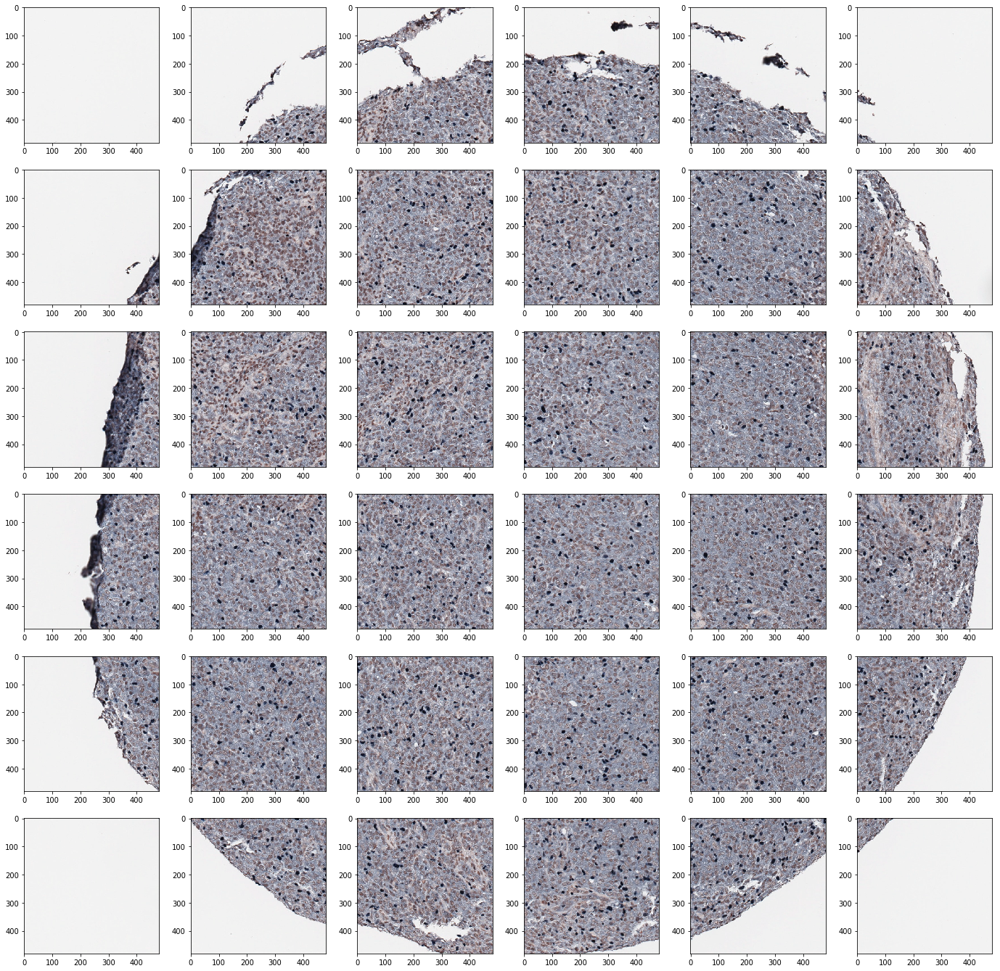

In [112]:
#Image Patches
fig,ax = plt.subplots(6,6)
fig.set_size_inches(24,24)
for i in range(len(ax)):
    for j in range(len(ax[0])):
        ax[j,i].imshow(X[(i*6)+j])

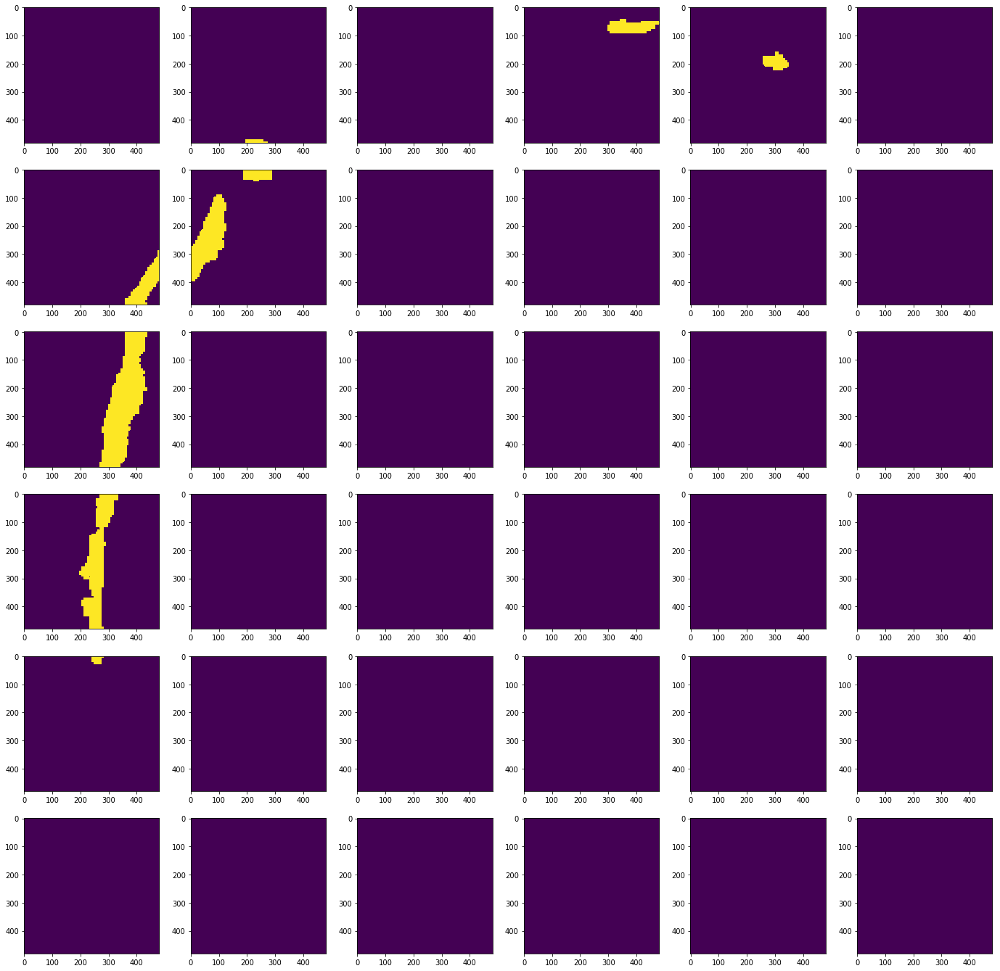

In [113]:
# Mask Patches
fig,ax = plt.subplots(6,6)
fig.set_size_inches(24,24)
for i in range(len(ax)):
    for j in range(len(ax[0])):
        ax[j,i].imshow(y[(i*6)+j])

In [7]:
#Model Definition

input_width = scaled_win_w
input_height = scaled_win_h
num_channels = 3

inputs = layers.Input((input_width, input_height, num_channels))

c1 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
c1 = layers.Dropout(0.1)(c1)
c1 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)

p1 = layers.MaxPooling2D((2,2))(c1)
c2 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
c2 = layers.Dropout(0.1)(c2)
c2 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)

p2 = layers.MaxPooling2D((2,2))(c2)
c3 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
c3 = layers.Dropout(0.2)(c3)
c3 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

p3 = layers.MaxPooling2D((2,2))(c3)
c4 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p3)
c4 = layers.Dropout(0.2)(c4)
c4 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

p4 = layers.MaxPooling2D((2,2))(c4)
c5 = layers.Conv2D(256, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(p4)
c5 = layers.Dropout(0.3)(c5)
c5 = layers.Conv2D(256, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

u6 = layers.Conv2DTranspose(128, (2,2), strides=(2,2), padding='same')(c5)
u6 = layers.concatenate([u6,c4])
c6 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u6)
c6 = layers.Dropout(0.2)(c6)
c6 = layers.Conv2D(128, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c6)

u7 = layers.Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c6)
u7 = layers.concatenate([u7,c3])
c7 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u7)
c7 = layers.Dropout(0.2)(c7)
c7 = layers.Conv2D(64, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c7)

u8 = layers.Conv2DTranspose(32, (2,2), strides=(2,2), padding='same')(c7)
u8 = layers.concatenate([u8,c2])
c8 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u8)
c8 = layers.Dropout(0.1)(c8)
c8 = layers.Conv2D(32, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c8)

u9 = layers.Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(c8)
u9 = layers.concatenate([u9,c1])
c9 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(u9)
c9 = layers.Dropout(0.1)(c9)
c9 = layers.Conv2D(16, (3,3), activation='relu', kernel_initializer='he_normal', padding='same')(c9)

outputs = layers.Conv2D(1,(1,1), activation='sigmoid')(c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 384, 384, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 384, 384, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 384, 384, 16) 0           conv2d[0][0]                     
________________________________________________________________________________

In [9]:
#reshape y
if len(y.shape) < 4:
    y = np.expand_dims(y, axis=3)

#Shuffle
idx = np.random.permutation(len(X))
X = X[idx]
y = y[idx]

history = model.fit(X, y, epochs=3, batch_size=16,
                    validation_split=0.15)

Train on 397 samples, validate on 71 samples
Epoch 1/3
397/397 [==============================] - 195s 491ms/sample - loss: 0.1080 - acc: 0.9701 - val_loss: 0.0972 - val_acc: 0.9735
Epoch 2/3
397/397 [==============================] - 198s 500ms/sample - loss: 0.1006 - acc: 0.9690 - val_loss: 0.0805 - val_acc: 0.9737
Epoch 3/3
397/397 [==============================] - 198s 499ms/sample - loss: 0.1151 - acc: 0.9701 - val_loss: 0.1052 - val_acc: 0.9735


In [10]:
model.save('unet_model')

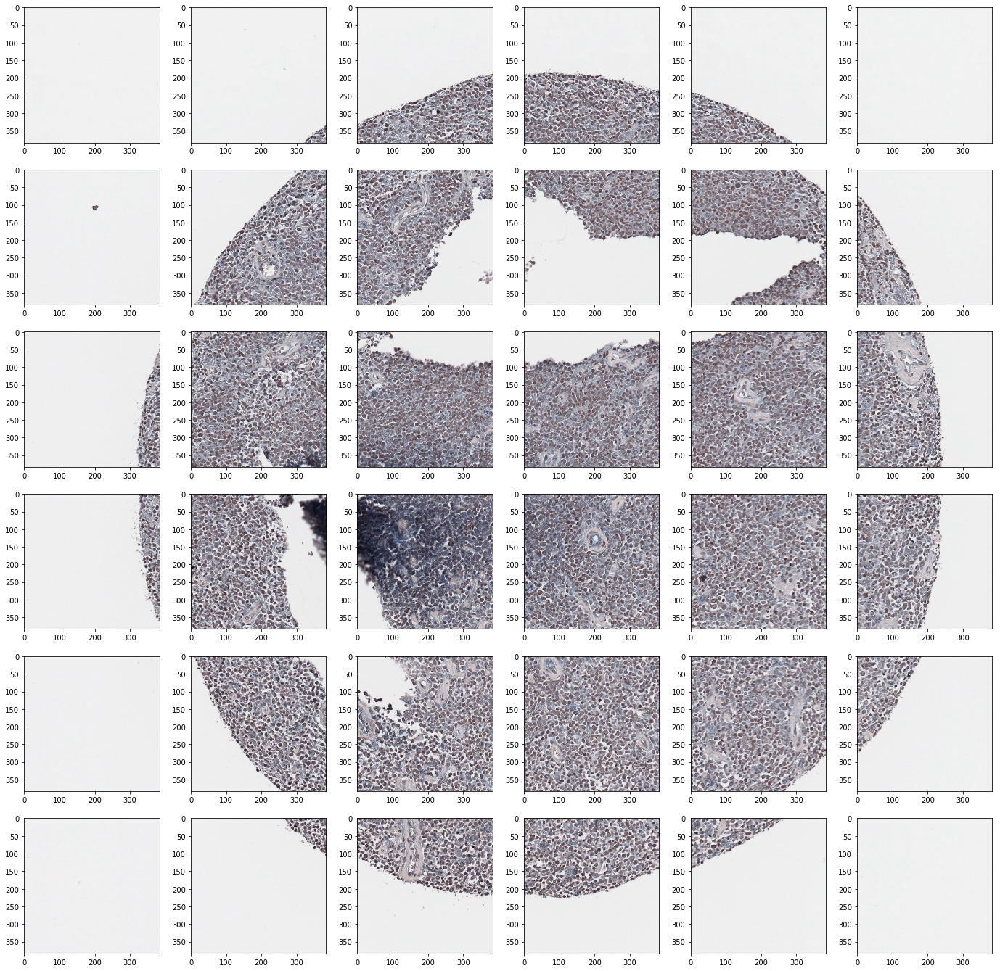

In [95]:
i=1
img = cv2.imread('../BCCA_Artifacts/tFL H_1_2_4_FOXP3.jpg')

x_count = 0
y_count = 0

X_pred = []

for i in range(num_win_y):
    for j in range(num_win_x):
        win_img = img[y_count*win_h:(y_count+1)*win_h,x_count*win_w:(x_count+1)*win_w,:]/255.0
        scaled_win_img = cv2.resize(win_img, (scaled_win_w, scaled_win_h))

        X_pred.append(scaled_win_img)
        y_count+=1
    x_count+=1
    y_count=0
X_pred = np.asarray(X_pred)

fig,ax = plt.subplots(6,6)
fig.set_size_inches(24,24)
for i in range(len(ax)):
    for j in range(len(ax[0])):
        ax[j,i].imshow(X_pred[(i*6)+j])
plt.show()

In [96]:
model = tf.keras.models.load_model('unet_model')

y_patches = model.predict(X_pred)

In [111]:
mask= np.zeros((2304,2304))

x_count=0
y_count=0
for i in range(num_win_y):
    for j in range(num_win_x):
        mask[y_count*scaled_win_h:(y_count+1)*scaled_win_h,x_count*scaled_win_w:(x_count+1)*scaled_win_w] = np.reshape(y_patches[(i*6)+j], (384,384))
        y_count+=1
    x_count+=1
    y_count=0

#fixed img
mask_o = mask.copy()*255

img_out = cv2.resize(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2GRAY),(2304,2304))
img_out=img_out - mask_o


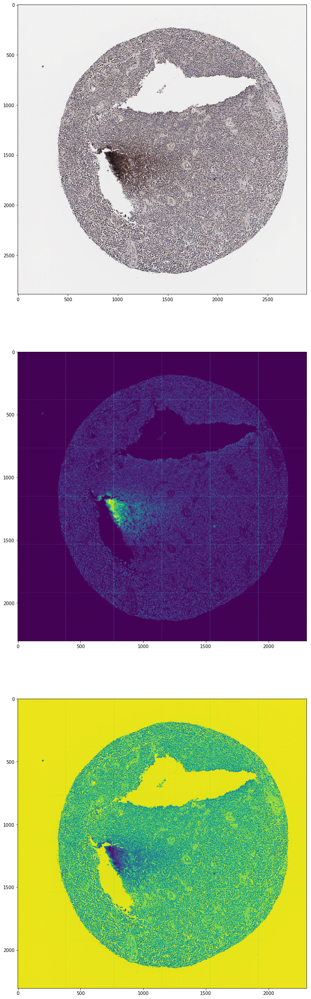

In [112]:
fig,ax = plt.subplots(3)
fig.set_facecolor('w')
fig.set_size_inches(21,40)

ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax[1].imshow(mask)
ax[2].imshow(img_out)
#plt.savefig('predict_{}.png'.format(i))
plt.show()


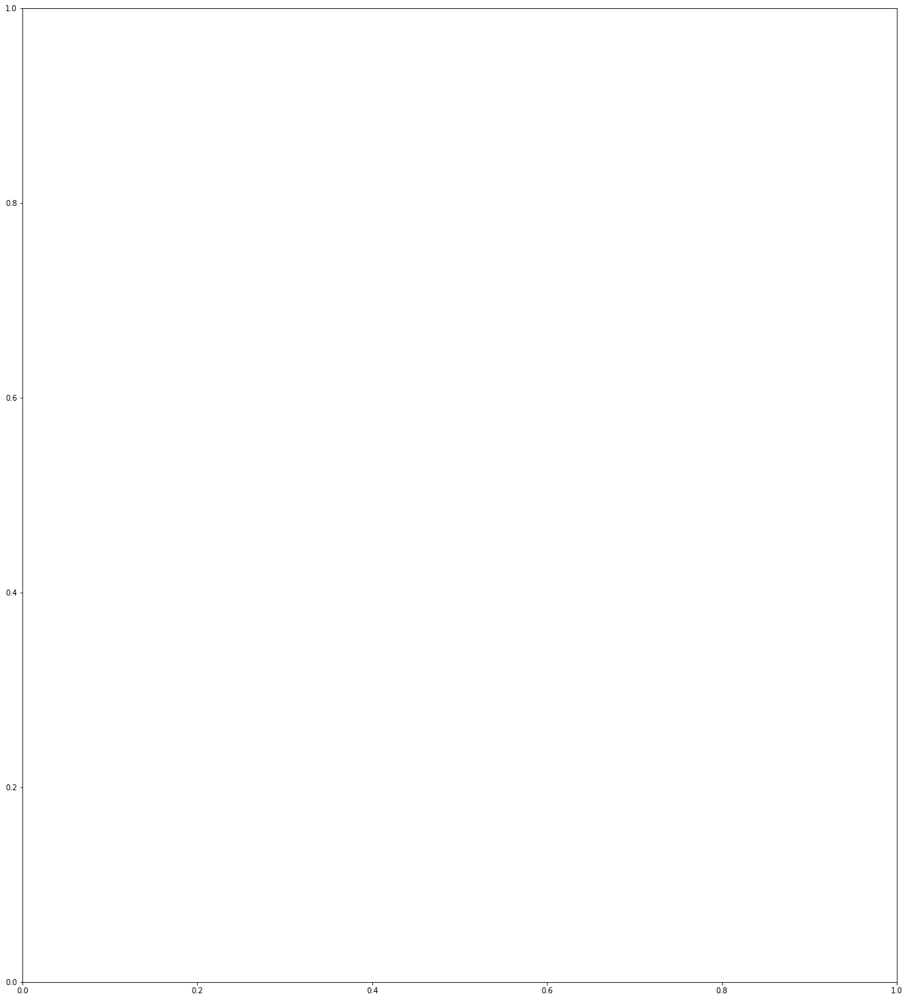

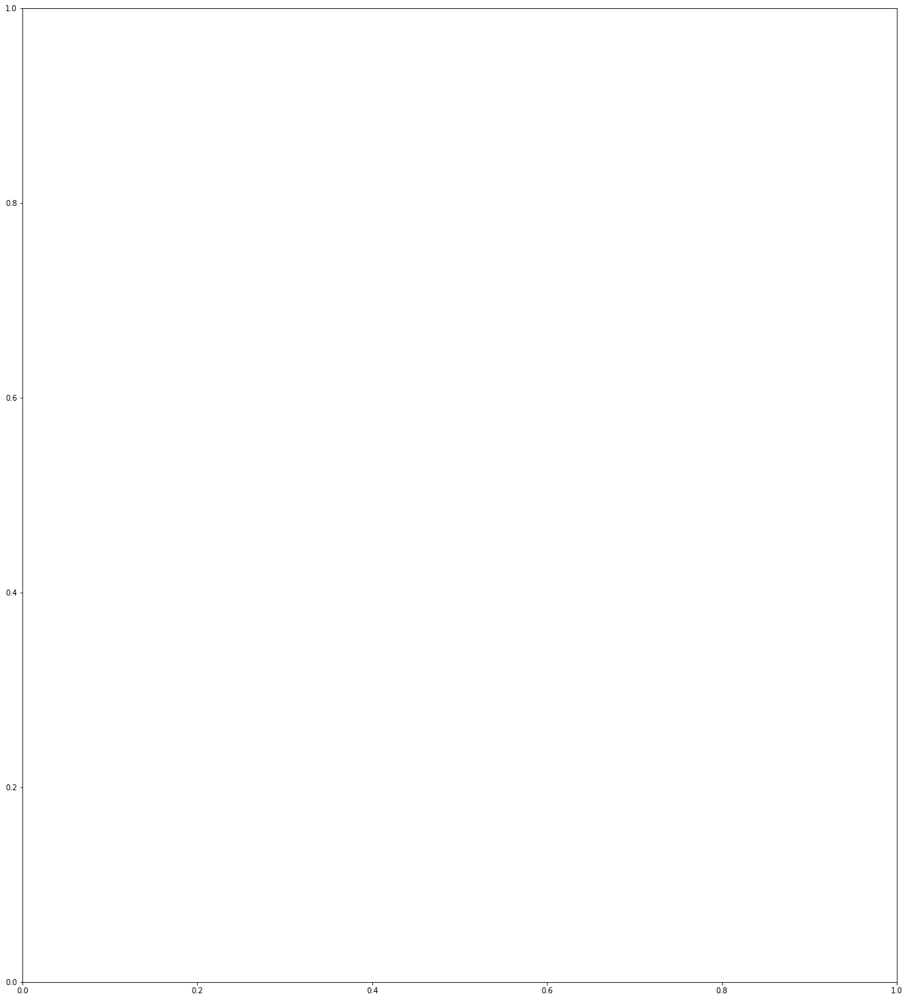

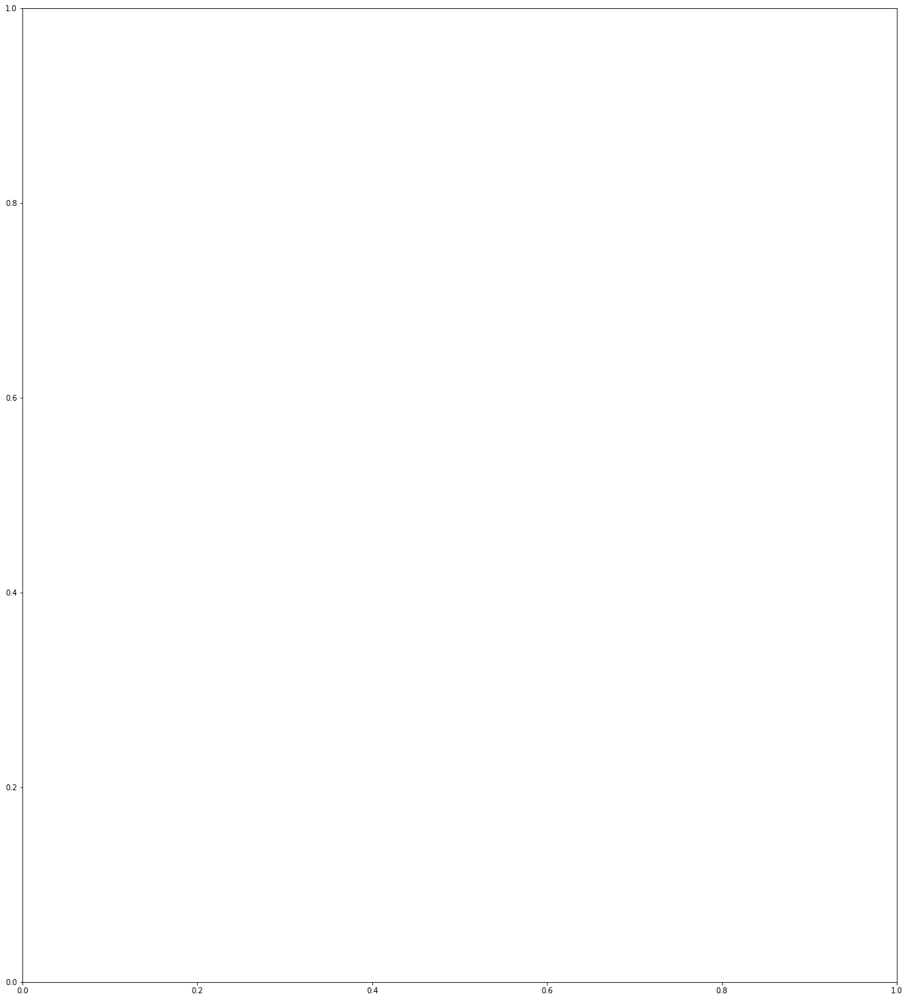

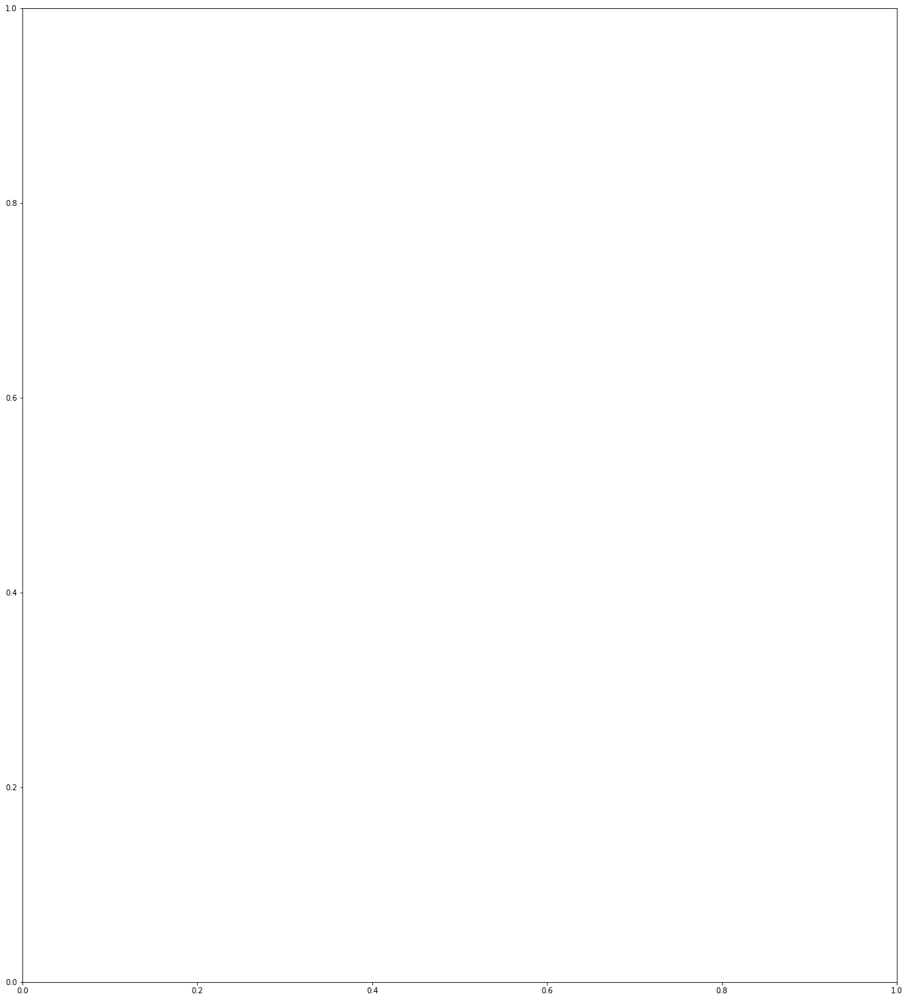

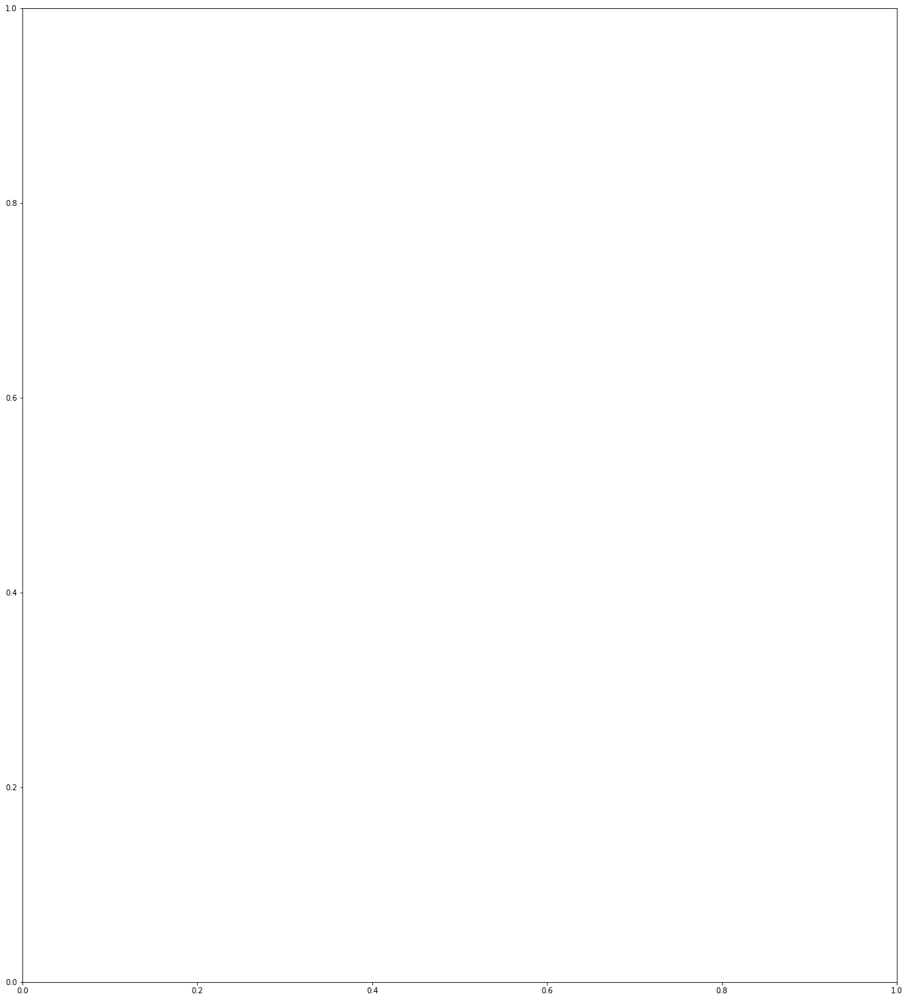

...

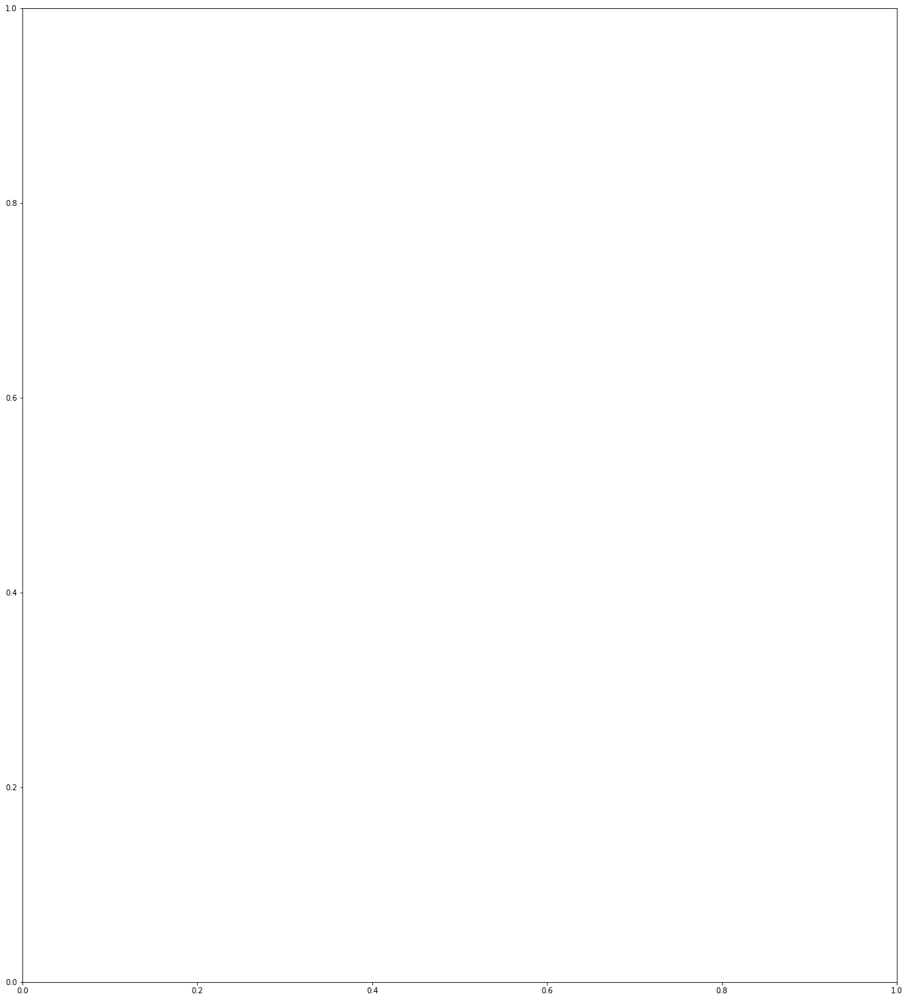

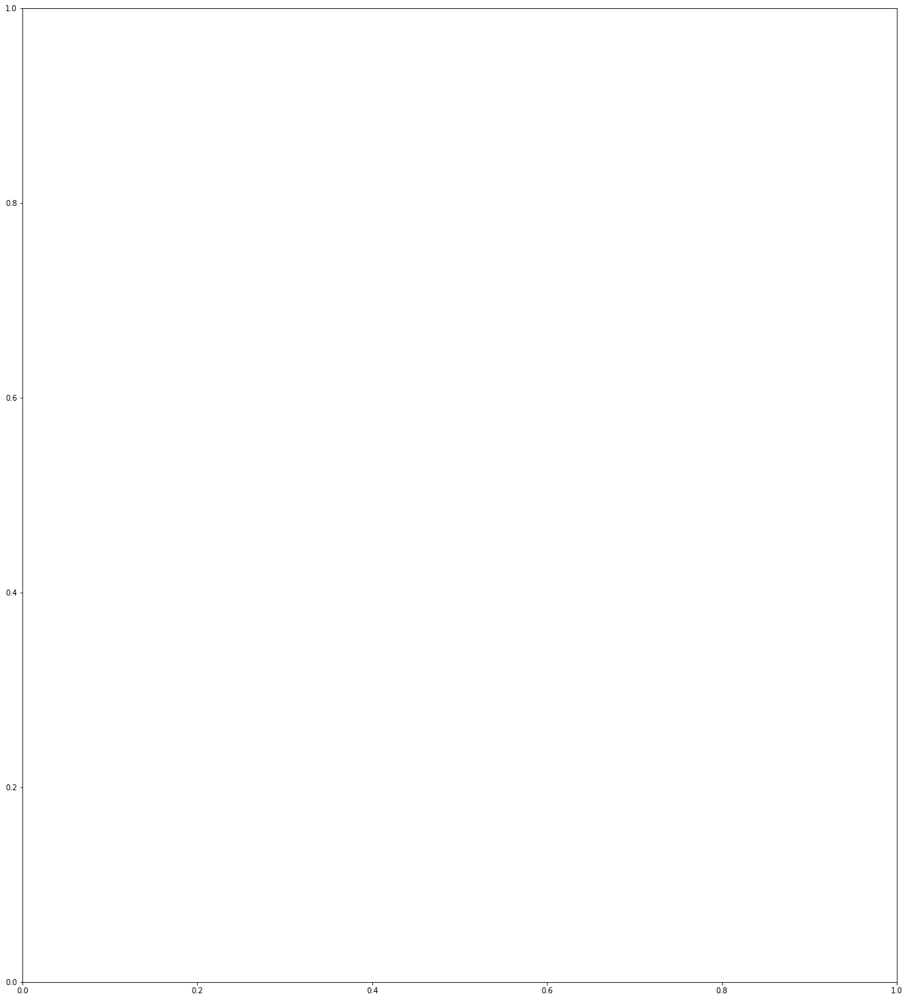

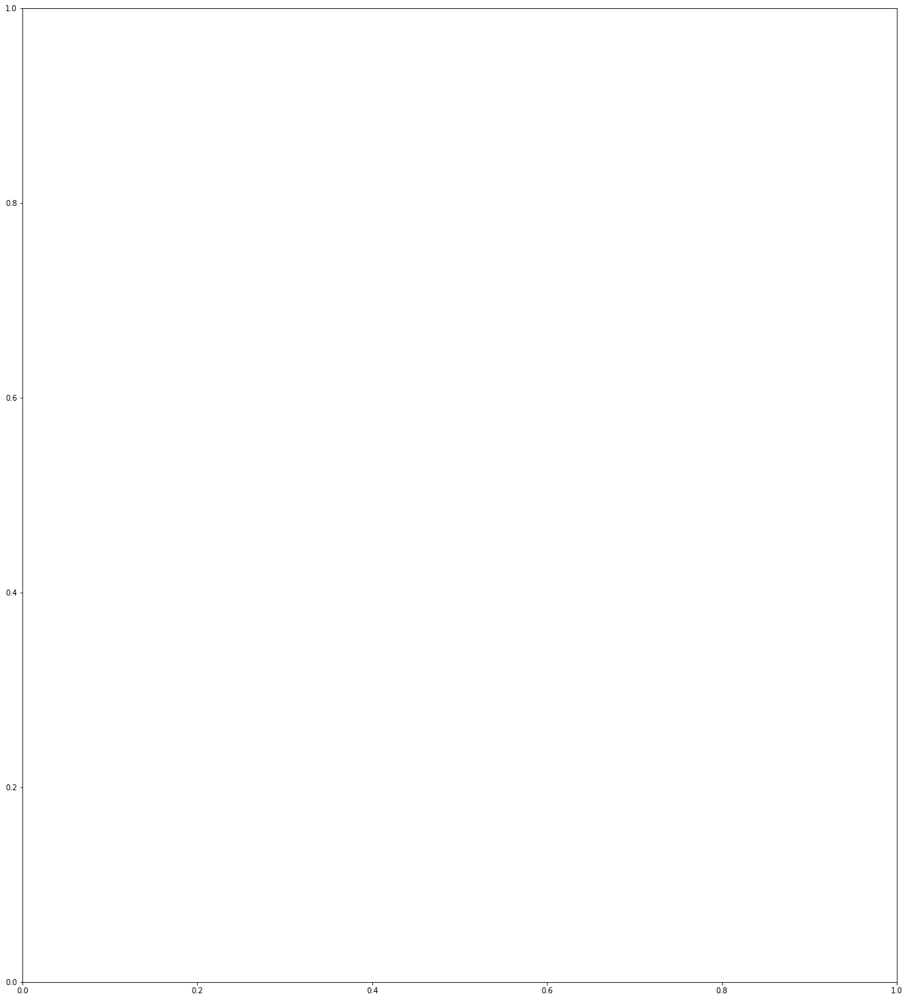

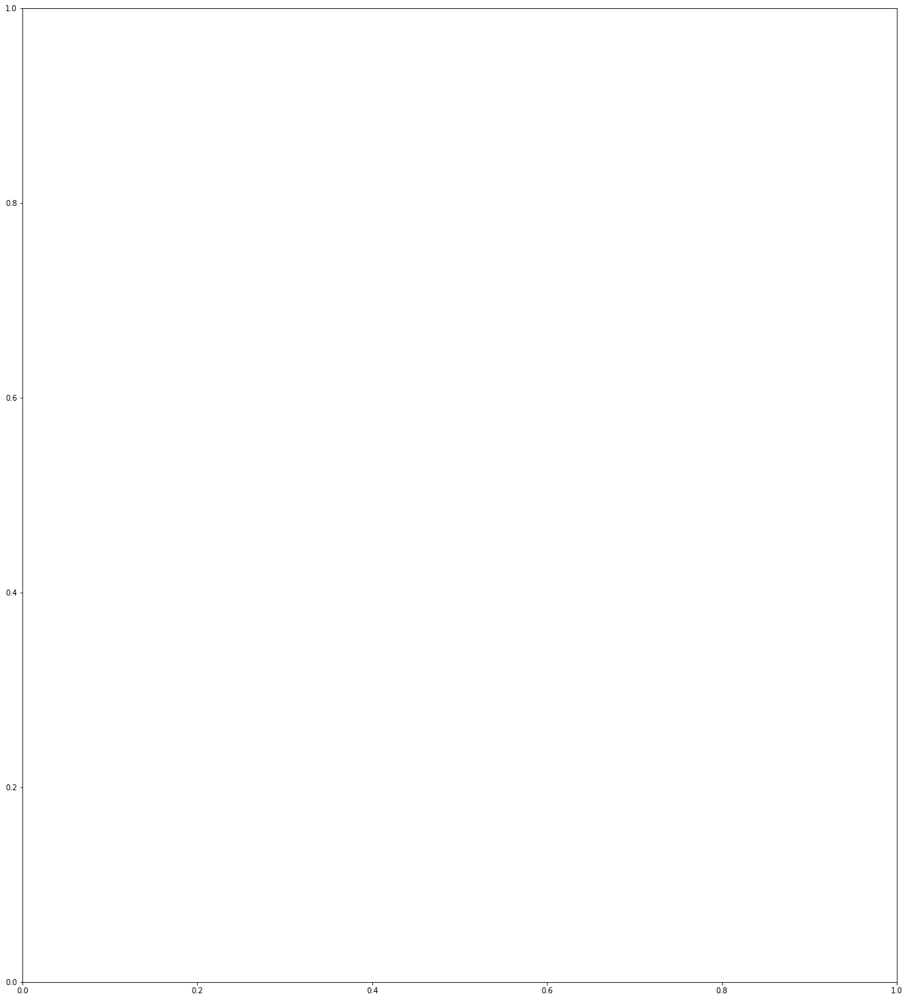

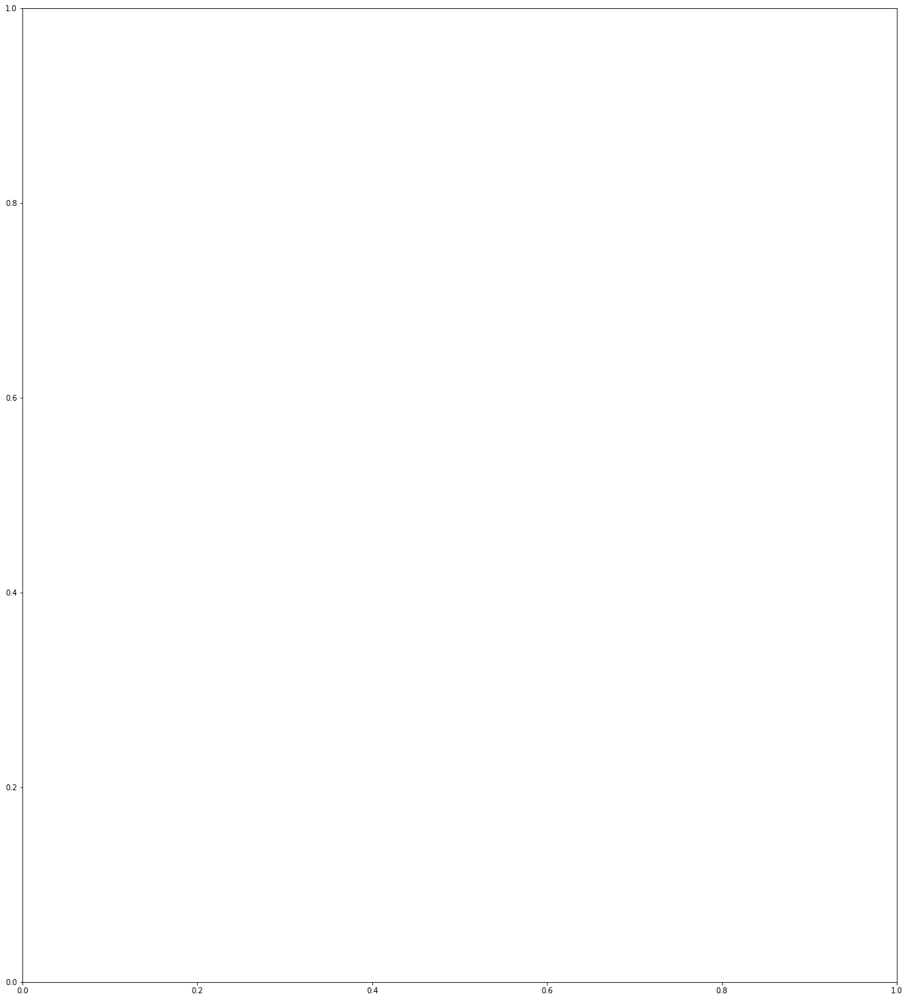

In [50]:
for idx in range(len(imgs)):
    img = imgs[idx]

    x_count = 0
    y_count = 0

    X_pred = []

    for i in range(num_win_y):
        for j in range(num_win_x):
            win_img = img[y_count*win_h:(y_count+1)*win_h,x_count*win_w:(x_count+1)*win_w,:]/255.0
            scaled_win_img = cv2.resize(win_img, (scaled_win_w, scaled_win_h))

            X_pred.append(scaled_win_img)
            y_count+=1
        x_count+=1
        y_count=0
    X_pred = np.asarray(X_pred)
    y_patches = model.predict(X_pred)
    
    mask= np.zeros((2304,2304))
    x_count=0
    y_count=0
    
    for i in range(num_win_y):
        for j in range(num_win_x):
            mask[y_count*scaled_win_h:(y_count+1)*scaled_win_h,x_count*scaled_win_w:(x_count+1)*scaled_win_w] = np.reshape(y_patches[(i*6)+j], (384,384))
            y_count+=1
        x_count+=1
        y_count=0
    fig,ax = plt.subplots(2)
    fig.set_facecolor('w')
    fig.set_size_inches(21,24)

    ax[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[0].set_title('Input Image')
    ax[1].imshow(mask)
    ax[1].set_title('Predicted Artifact Mask')
    plt.savefig('predict_{}.png'.format(idx))
    plt.clf()
    plt.cla()

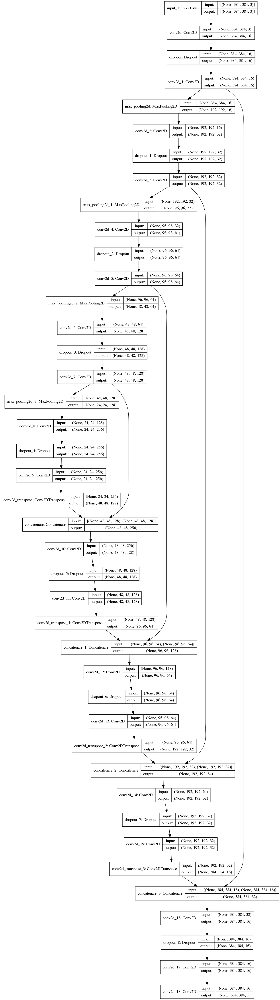

In [5]:
model = tf.keras.models.load_model('unet_model')

from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model.png', show_shapes=True)

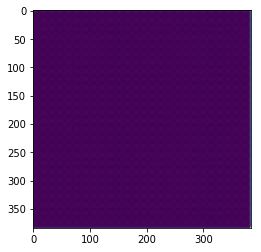

In [21]:
plt.imshow(np.reshape(y_patches[4],(384,384)))

In [27]:
y_patches[4,383,:,:]

array([[0.08537596],
       [0.03675726],
       [0.02376997],
       [0.02350733],
       [0.02601007],
       [0.02245629],
       [0.02301109],
       [0.02653372],
       [0.02389148],
       [0.0241501 ],
       [0.02367663],
       [0.02569941],
       [0.02397141],
       [0.02456892],
       [0.02361551],
       [0.02551472],
       [0.02406752],
       [0.02450892],
       [0.02357784],
       [0.02550703],
       [0.02403197],
       [0.02456084],
       [0.02355421],
       [0.02547511],
       [0.02403516],
       [0.02450585],
       [0.02357253],
       [0.02555144],
       [0.02404538],
       [0.02456647],
       [0.02358446],
       [0.02549386],
       [0.02406362],
       [0.02451983],
       [0.02358568],
       [0.02554825],
       [0.02403706],
       [0.02457142],
       [0.02357677],
       [0.02549052],
       [0.0240615 ],
       [0.02451891],
       [0.02357802],
       [0.02555653],
       [0.02404678],
       [0.02456927],
       [0.0235838 ],
       [0.025

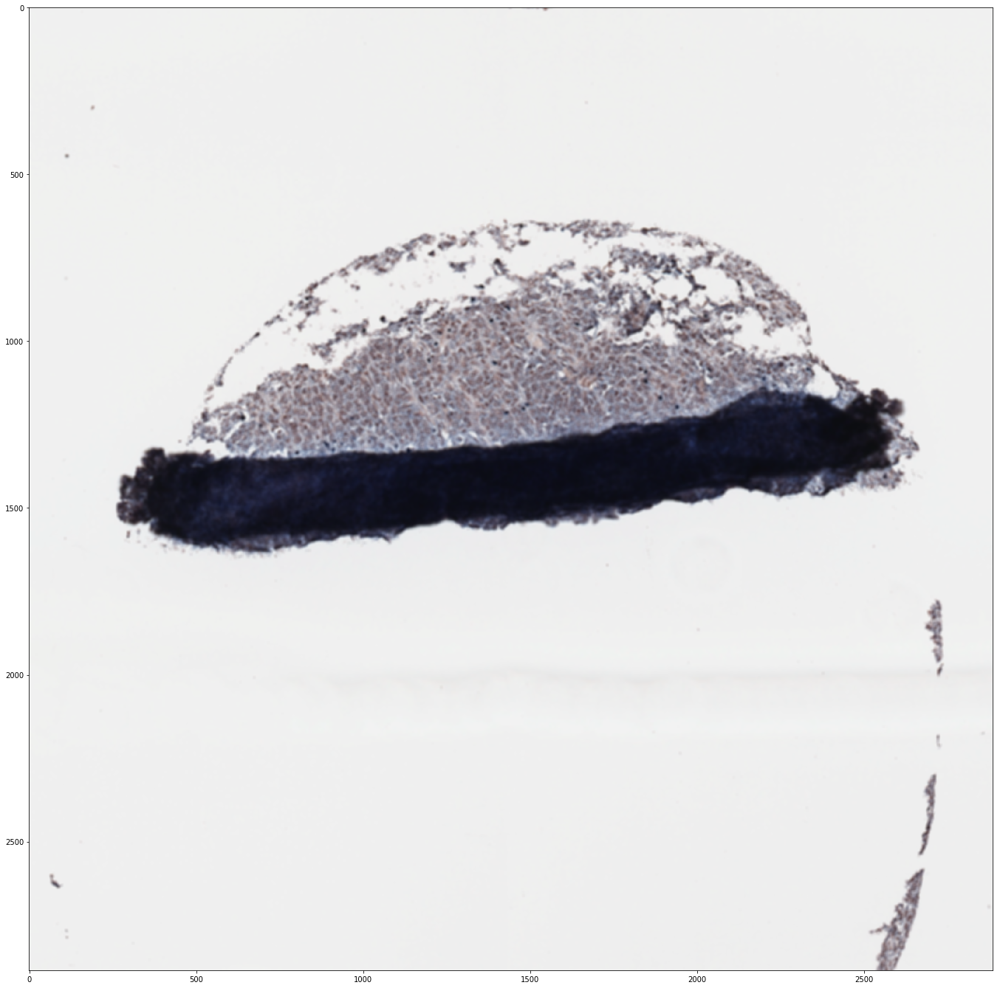

In [38]:
fig,ax = plt.subplots()
fig.set_size_inches(24,24)
ax.imshow(cv2.GaussianBlur(img, (11,11), 5))

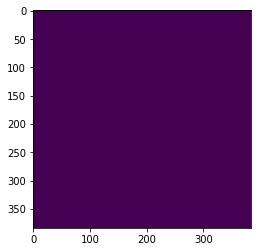

In [53]:
plt.imshow(y[0])

In [85]:
m = np.zeros(mask.shape)
m[np.where(mask>=0.3)]=1

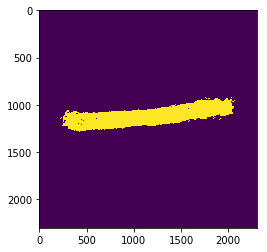

In [86]:
plt.imshow(m)

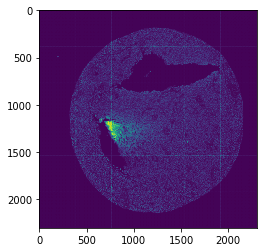

In [110]:
plt.imshow(mask_o.astype(int))

In [1]:
mask_o

NameError: name 'mask_o' is not defined

In [3]:
import os

In [12]:
os.curdir

'.'